# Monet2Photo CycleGAN

1. 데이터  오버샘플링 + (color Jitter) + SA 추가 + 에폭 수 증가

- color Jitter? : 색 및 명도 등 조절 (중지: 학습코드에서 에러 발생)
- SA: 각 레이어에서 중요한 전역적 정보가 더 강하게 반영 / 객체 간 관계 더 잘 학습
- 
- ✅ RESNET -> Residual 블럭 수 조절 (256x256 : 9)(128x128 : 6) 우리는 256이므로 9 -> 6으로 변환
- ✅ SA기법 추가 -> 특징 축소를 위해 삭제
- ✅ 학습률 감소 및 에폭 수 추가
- 
- ✅ Perceptual Loss (VGG Loss) 추가
- ✅ 스타일 전이 데이터 활용 (Pretrained Style Transfer 모델 사용)
- https://www.tensorflow.org/tutorials/generative/style_transfer?hl=ko

In [79]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

### CUDA 체크

In [81]:
import torch
print(torch.__version__)  # PyTorch 버전 확인
print(torch.cuda.is_available())  # CUDA 사용 가능 여부 확인
print(torch.cuda.get_device_name(0))  # GPU 이름 확인


2.6.0+cu118
True
NVIDIA GeForce RTX 2060 SUPER


## Getting Started

In [83]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()


import glob
import random
import os
from torch.utils.data import Dataset
from PIL import Image

# Inspired by https://github.com/aitorzip/PyTorch-CycleGAN/blob/master/datasets.py
class ImageDataset(Dataset):
    def __init__(self, root, transform=None, mode='train'):
        self.transform = transform
        self.files_A = sorted(glob.glob(os.path.join(root, '%sA' % mode) + '/*.*'))
        self.files_B = sorted(glob.glob(os.path.join(root, '%sB' % mode) + '/*.*'))
        if len(self.files_A) > len(self.files_B):
            self.files_A, self.files_B = self.files_B, self.files_A
        self.new_perm()
        assert len(self.files_A) > 0

    def new_perm(self):
        self.randperm = torch.randperm(len(self.files_B))[:len(self.files_A)]

    def __getitem__(self, index):
        item_A = self.transform(Image.open(self.files_A[index % len(self.files_A)]))
        item_B = self.transform(Image.open(self.files_B[self.randperm[index]]))
        if item_A.shape[0] != 3: 
            item_A = item_A.repeat(3, 1, 1)
        if item_B.shape[0] != 3: 
            item_B = item_B.repeat(3, 1, 1)
        if index == len(self) - 1:
            self.new_perm()
        # Old versions of PyTorch didn't support normalization for different-channeled images
        return (item_A - 0.5) * 2, (item_B - 0.5) * 2

    def __len__(self):
        return min(len(self.files_A), len(self.files_B))

## Generator

#### Residual Block
ResidualBlock: 간단하게 원래 이미지 -> 훈련 -> Convolution Layer -> 변환성공
의 흐름을 따르는데, 훈련 다음에 원래 이미지를 한번 더 학습시켜서 원래 이미지의 특성을 유지시켜주는 것

In [86]:
class ResidualBlock(nn.Module):
    def __init__(self, input_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.conv2 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.instancenorm = nn.InstanceNorm2d(input_channels) 
        # Norm2d의 변형버전 InstanceNorm2d 
        # 정규화 방법. 우리가 기존에 했던 BatchNorm과는 조금 다름
        # BatchNorm: batch 단위로 평균과 분산을 처리 (일반적 CNN 사용) 
        # InstanceNorm: 각 채널 별 개별 이미지에 대해 평균과 분산으로 처리 (GAN에서 사용 - 개별 스타일 이미지의 특성 보존을 위해)
        self.activation = nn.ReLU()

    def forward(self, x):
        original_x = x.clone() # x값이 들어오면 일단 카피
        x = self.conv1(x)
        x = self.instancenorm(x) # nomalization
        x = self.activation(x)
        x = self.conv2(x)
        x = self.instancenorm(x)
        return original_x + x #원래 입력값 + conV된 값을 합쳐줌 - ResidualBlock

# !!!수정 : SA 추가
SA: 요소들끼리 관계 고려해서 정보처리 기법/ 보통 Residual Block 후에 추가

In [88]:
import torch.nn.functional as F

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super(SelfAttention, self).__init__()
        
        self.in_channels = in_channels
        self.query = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.key = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.value = nn.Conv2d(in_channels, in_channels, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        
        self.attn_conv = nn.Conv2d(in_channels, in_channels, kernel_size=1)

    def forward(self, x):
        batch_size, C, H, W = x.size()
        
        # Query, Key, Value 계산
        Q = self.query(x).view(batch_size, C // 8, -1)  # (batch_size, C//8, H*W)
        K = self.key(x).view(batch_size, C // 8, -1)    # (batch_size, C//8, H*W)
        V = self.value(x).view(batch_size, C, -1)       # (batch_size, C, H*W)
        
        # Attention 점수 계산
        attention = torch.bmm(Q.permute(0, 2, 1), K)    # (batch_size, H*W, H*W)
        attention = F.softmax(attention, dim=-1)         # (batch_size, H*W, H*W)

        # Weighted sum of Values
        out = torch.bmm(V, attention.permute(0, 2, 1))  # (batch_size, C, H*W)
        out = out.view(batch_size, C, H, W)
        
        # Gamma를 사용하여 원본과 Attention 출력을 합침
        out = self.gamma * out + x
        
        # 채널을 유지하는 Conv 레이어로 최종 출력
        out = self.attn_conv(out)
        
        return out


#### Contracting and Expanding Blocks


In [90]:
class ContractingBlock(nn.Module):
    
    # Conv2d를 통해 채널 수 확장 (width, height 축소)
    # input_channels -> input_channels * 2
    def __init__(self, input_channels, use_bn=True, kernel_size=3, activation='relu'):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=kernel_size, padding=1, stride=2, padding_mode='reflect')
        self.activation = nn.ReLU() if activation == 'relu' else nn.LeakyReLU(0.2)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels * 2)
        self.use_bn = use_bn

    def forward(self, x):
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x

class ExpandingBlock(nn.Module):
    # Conv2dTranspose를 통해 채널 수 축소 (width, height 확장)
    # input_channels -> input_channels // 2
    def __init__(self, input_channels, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.conv1 = nn.ConvTranspose2d(input_channels, input_channels // 2, kernel_size=3, stride=2, padding=1, output_padding=1)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x

    # 압축 -> 확장 이후 정리하는 단계로 FeatureMapBlock 이용
    # 보통 Conv, Normalization, Activation(ReLU) 으로 이루어져있음.
class FeatureMapBlock(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=7, padding=3, padding_mode='reflect')

    def forward(self, x):
        x = self.conv(x)
        return x

#### CycleGAN Generator


# !!!수정 SA 추가

In [93]:
import torch
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, input_channels, output_channels, hidden_channels=64):
        super(Generator, self).__init__()
        
        # Feature Map Block (입력 채널을 hidden_channels로 변환)
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        
        # Contracting Block 2번 (이미지 크기 축소)
        self.contract1 = ContractingBlock(hidden_channels)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        
        # Residual Block들을 여러 번 적용 (특징을 추출)
        res_mult = 4
        self.res0 = ResidualBlock(hidden_channels * res_mult)
        self.res1 = ResidualBlock(hidden_channels * res_mult)
        self.res2 = ResidualBlock(hidden_channels * res_mult)
        self.res3 = ResidualBlock(hidden_channels * res_mult)
        self.res4 = ResidualBlock(hidden_channels * res_mult)
        self.res5 = ResidualBlock(hidden_channels * res_mult)
        # self.res6 = ResidualBlock(hidden_channels * res_mult)
        # self.res7 = ResidualBlock(hidden_channels * res_mult)
        # self.res8 = ResidualBlock(hidden_channels * res_mult)
        
        # # Self-Attention 적용 (Residual Block 후에)
        # self.attn0 = SelfAttention(hidden_channels * res_mult)
        # self.attn1 = SelfAttention(hidden_channels * res_mult)
        # self.attn2 = SelfAttention(hidden_channels * res_mult)
        # self.attn3 = SelfAttention(hidden_channels * res_mult)
        
        # Expanding Block (이미지 크기 복원)
        self.expand2 = ExpandingBlock(hidden_channels * 4)
        self.expand3 = ExpandingBlock(hidden_channels * 2)
        
        # Feature Map Block (출력 채널로 변환)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.tanh = torch.nn.Tanh()  # 최종 출력 이미지는 [-1, 1] 사이로 정규화

    def forward(self, x):
        # 입력 -> 업샘플링 -> 축소
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        
        # # Residual Block 적용 후 Self-Attention 추가
        # x3 = self.res0(x2)
        # x3 = self.attn0(x3)  # Self-Attention 적용
        
        # x4 = self.res1(x3)
        # x4 = self.attn1(x4)  # Self-Attention 적용
        
        # x5 = self.res2(x4)
        # x5 = self.attn2(x5)  # Self-Attention 적용
        
        # x6 = self.res3(x5)
        # x6 = self.attn3(x6)  # Self-Attention 적용
        
        # # 나머지 Residual Block들
        # x7 = self.res4(x6)
        # x8 = self.res5(x7)
        # x9 = self.res6(x8)
        # x10 = self.res7(x9)
        # x11 = self.res8(x10)

        # Residual Block 적용
        x3 = self.res0(x2)
        x4 = self.res1(x3)
        x5 = self.res2(x4)
        x6 = self.res3(x5)
        x7 = self.res4(x6)
        x8 = self.res5(x7)
        
        # Expanding Block -> 다운샘플링 후 최종 출력
        x9 = self.expand2(x8)
        x10 = self.expand3(x9)
        xn = self.downfeature(x10)
        
        return self.tanh(xn)


In [94]:
# class Generator(nn.Module):
#     def __init__(self, input_channels, output_channels, hidden_channels=64):
#         super(Generator, self).__init__()
#         self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
#         # why contract 2번?: 2번정도만 축소해도 충분하다고 함.
#         self.contract1 = ContractingBlock(hidden_channels)
#         self.contract2 = ContractingBlock(hidden_channels * 2)
#         res_mult = 4
#         self.res0 = ResidualBlock(hidden_channels * res_mult)
#         self.res1 = ResidualBlock(hidden_channels * res_mult)
#         self.res2 = ResidualBlock(hidden_channels * res_mult)
#         self.res3 = ResidualBlock(hidden_channels * res_mult)
#         self.res4 = ResidualBlock(hidden_channels * res_mult)
#         self.res5 = ResidualBlock(hidden_channels * res_mult)
#         self.res6 = ResidualBlock(hidden_channels * res_mult)
#         self.res7 = ResidualBlock(hidden_channels * res_mult)
#         self.res8 = ResidualBlock(hidden_channels * res_mult)
#         self.expand2 = ExpandingBlock(hidden_channels * 4)
#         self.expand3 = ExpandingBlock(hidden_channels * 2)
#         self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
#         self.tanh = torch.nn.Tanh()

        
#     # 위에 정의된 순서대로 쭉 학습
#     def forward(self, x):
#         x0 = self.upfeature(x)
#         x1 = self.contract1(x0)
#         x2 = self.contract2(x1)
#         x3 = self.res0(x2)
#         x4 = self.res1(x3)
#         x5 = self.res2(x4)
#         x6 = self.res3(x5)
#         x7 = self.res4(x6)
#         x8 = self.res5(x7)
#         x9 = self.res6(x8)
#         x10 = self.res7(x9)
#         x11 = self.res8(x10)
#         x12 = self.expand2(x11)
#         x13 = self.expand3(x12)
#         xn = self.downfeature(x13)
#         return self.tanh(xn)
        
        

## PatchGAN Discriminator

다음으로 판별자인 PatchGAN을 정의합니다. Pix2Pix에서 본 것과 매우 유사합니다.


PatchGAN ?
-> 이미치 패치를 개별적으로 판단 후 평균을 구함

-> Ex. 256 x 256 이미지를 70x70으로 나누면, 여러개의 패치가 생김.
-> 그러면 각 패치에서 진짜/가짜 판별 후 모든 결과 평균을 내는 방식

-> 저해상도 이미지변환 (스타일변환)에 좋음. 

(일반 Discriminator는 전체 이미지를 하나의 확률로 출력하며, 고해상도 이미지 생성에 유리함)


In [96]:
class Discriminator(nn.Module):
    def __init__(self, input_channels, hidden_channels=64):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False, kernel_size=4, activation='lrelu') #LeakyReLU 사용
        self.contract2 = ContractingBlock(hidden_channels * 2, kernel_size=4, activation='lrelu')
        self.contract3 = ContractingBlock(hidden_channels * 4, kernel_size=4, activation='lrelu')
        # self.contract3에서 나오는 채널 수 8개를 (kernel_size=1)을 통해 하나로 압축
        self.final = nn.Conv2d(hidden_channels * 8, 1, kernel_size=1)

    def forward(self, x):
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        xn = self.final(x3)
        return xn

## Training Preparation

이제 훈련을 위해 모든 것을 결합할 수 있습니다! 매개변수를 정의하여 시작합니다.

* adv_criterion: GAN이 판별자를 얼마나 잘 속이고 판별자가 GAN을 얼마나 잘 포착하는지 추적하는 적대적 손실 함수
* recon_criterion: 이미지를 "재구성"하는 ground truth에 유사한 이미지를 보상하는 손실 함수
--------------------------------
* Adversarial Loss (adv_criterion)로 Generator가 더 진짜 같은 이미지를 생성하도록 유도합니다.
* MSELoss를 사용해 Discriminator의 예측 값과 목표 값(1 또는 0) 사이의 오차를 최소화합니다.


* Reconstruction Loss (recon_criterion)로 Generator가 정답 이미지와 최대한 비슷한 이미지를 생성하도록 학습합니다.
* L1Loss를 사용해 생성된 이미지와 실제 이미지 간의 픽셀 차이를 최소화합니다.
--------------------------------

* n_epochs: 훈련 시 전체 데이터 세트를 반복하는 횟수
* dim_A: 더미 A에 있는 이미지의 채널 수
* dim_B: 더미 B에 있는 이미지의 채널 수(시각화에서 이것은 현재 dim_A와 동일한 것으로 취급됨을 참고하십시오)
* display_step: 이미지를 표시/시각화하는 빈도
* batch_size: 정방향/역방향 패스당 이미지 수
* lr: 학습률
* target_shape: 입력 및 출력 이미지의 크기(픽셀 단위)
* load_shape: 단순 데이터 증대로 target_shape에 무작위로 자르기 전에 이미지를 로드할 데이터 세트의 크기
* device: 장치 유형

# !!!수정
L1 Loss + Perceptual Loss
- 이미지의 세부적인 특징을 반영하지 못함 (L1 Loss)
- 더 고수준 스타일 정보 학습 가능 (Perceptual Loss)
- 일단 킵

In [99]:
class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg19(pretrained=True).features  # VGG19 모델 불러오기
        self.vgg_layers = nn.Sequential(*list(vgg.children())[:8])  # 앞쪽 레이어만 사용
        for param in self.vgg_layers.parameters():
            param.requires_grad = False  # VGG 가중치는 고정 (Gradient 업데이트 X)

    def forward(self, img1, img2):
        feat1 = self.vgg_layers(img1)  # 첫 번째 이미지의 특징 맵
        feat2 = self.vgg_layers(img2)  # 두 번째 이미지의 특징 맵
        loss = F.l1_loss(feat1, feat2)  # L1 Loss 사용하여 차이 계산
        return loss


In [100]:
import torch.nn.functional as F

adv_criterion = nn.MSELoss() 
# 왜 binary cross entropy 안쓸까? : GAN의 안정성이 MSELoss가 더 좋아서 GAN의 변형에는 보통 얘를 사용
recon_criterion = nn.L1Loss() 

n_epochs = 30
dim_A = 3
dim_B = 3
display_step = 2000
batch_size = 1
lr = 0.000002
load_shape = 286
target_shape = 256
device = 'cuda'

그런 다음 일부 데이터 증대(예: 자르기 및 무작위 수평 뒤집기)를 도입하면서 데이터세트의 이미지를 로드합니다.


In [102]:
# transform = transforms.Compose([
#     transforms.Resize(load_shape),
#     transforms.RandomCrop(target_shape), # 이미지의 랜덤한 부분을 자름 -> 이미지 크기 감소 + 데이터 증강 효과
#     transforms.RandomHorizontalFlip(), # 이미지를 랜덤으로 좌우반전 -> 이미지를 다양하게 학습가능
#     transforms.ToTensor(),
# ])

# import torchvision
# dataset = ImageDataset("Ghibli2Photo", transform=transform)

# !!! 수정


In [104]:
# from PIL import Image
# import os
# import glob
# from PIL import Image, ExifTags

# # 이미지 폴더 경로 설정 (현재 폴더 기준)
# image_folder = "C:/Users/07491/우기/machine_Learning/Ghibli2photo/Ghibli2Photo/trainB"  # 이미지가 있는 폴더 경로로 변경 가능
# image_files = glob.glob(os.path.join(image_folder, "Ghibli_*.jpg"))  # Ghiblidata_*.jpg 찾기

# # 검사 결과 저장 리스트
# cmyk_images = []
# exif_issues = []
# corrupted_images = []

# # 모든 이미지 검사
# for image_path in image_files:
#     try:
#         img = Image.open(image_path)

#         # ✅ CMYK 여부 확인
#         if img.mode != "RGB":
#             cmyk_images.append(image_path)

#         # ✅ EXIF 데이터 확인 (회전 정보 체크)
#         exif_data = img._getexif()
#         if exif_data:
#             for tag, value in exif_data.items():
#                 tag_name = ExifTags.TAGS.get(tag, tag)
#                 if tag_name == "Orientation":  # 회전 정보가 있으면 리스트에 추가
#                     exif_issues.append(image_path)

#         # ✅ 표준 JPEG 여부 확인 (손상된 파일 검출)
#         img.verify()  # 손상된 파일이면 오류 발생
#         img.close()

#     except Exception as e:
#         corrupted_images.append(image_path)
#         print(f"🚨 {image_path} 손상됨: {e}")

# # 검사 결과 출력
# print("\n🔍 검사 완료!")
# print(f"📌 총 {len(image_files)}개 파일 확인")
# print(f"🎨 CMYK 이미지: {len(cmyk_images)}개")
# print(f"📸 EXIF 회전 정보가 있는 이미지: {len(exif_issues)}개")
# print(f"⚠️ 손상된 이미지: {len(corrupted_images)}개")

# # 문제 파일 목록 출력
# if cmyk_images:
#     print("\n🚨 CMYK 변환이 필요한 파일:")
#     for img in cmyk_images:
#         print("  -", img)

# if exif_issues:
#     print("\n🚨 EXIF (회전 정보) 수정이 필요한 파일:")
#     for img in exif_issues:
#         print("  -", img)

# if corrupted_images:
#     print("\n🚨 손상된 파일 (열 수 없음):")
#     for img in corrupted_images:
#         print("  -", img)


In [105]:
# # 손상된 이미지 리스트
# corrupted_images = []

# # 이미지 폴더 설정
# image_folder = "C:/Users/07491/우기/machine_Learning/Ghibli2photo/Ghibli2Photo/trainB"  # 이미지 폴더 경로
# image_files = glob.glob(os.path.join(image_folder, "Ghiblidata_*.jpg"))  # Ghiblidata_* 파일 찾기

# for image_path in image_files:
#     try:
#         with Image.open(image_path) as img:
#             img.verify()  # 이미지 손상 검사
#     except Exception as e:
#         corrupted_images.append(image_path)
#         print(f"🚨 손상된 파일: {image_path}, 오류: {e}")

# print("\n🔍 손상된 이미지 리스트:")
# for img in corrupted_images:
#     print("  -", img)


In [106]:
# # 손상된 이미지 수정
# output_folder = "./trainB_B/"  # 변환된 이미지를 저장할 폴더

# # 폴더가 없으면 생성
# os.makedirs(output_folder, exist_ok=True)

# for image_path in cmyk_images + exif_issues:
#     try:
#         img = Image.open(image_path).convert("RGB")  # CMYK → RGB 변환
#         output_path = os.path.join(output_folder, os.path.basename(image_path))  # 저장 경로 설정
#         img.save(output_path, "JPEG", quality=95)  # 표준 JPEG로 저장
#         print(f"✅ 변환 완료: {output_path}")
#     except Exception as e:
#         print(f"🚨 변환 실패: {image_path}, 오류: {e}")


In [107]:
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, ConcatDataset

# 원본 데이터셋 (변형 없이)
original_transform = transforms.Compose([
    transforms.Resize(load_shape),
    transforms.ToTensor(),
])

# 변형된 데이터셋 (RandomCrop, Flip)
augmented_transform = transforms.Compose([
    transforms.Resize(load_shape),
    transforms.RandomCrop(target_shape),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

# 두 개의 데이터셋 생성
original_dataset = ImageDataset("Ghibli2Photo", transform=original_transform)
augmented_dataset = ImageDataset("Ghibli2Photo", transform=augmented_transform)

# 두 개의 데이터셋을 합침
dataset = ConcatDataset([original_dataset, augmented_dataset])


다음으로 생성기 및 판별기 및 optimizer를 초기화할 수 있습니다. CycleGAN의 경우 두 개의 GAN이 있으므로 두 개의 생성기와 두 개의 판별자가 있습니다:

*   Generator for horse to zebra (`gen_AB`)
*   Generator for zebra to horse (`gen_BA`)
*   Discriminator for horse (`disc_A`)
*   Discriminator for zebra (`disc_B`)

사전 훈련된 모델도 로드합니다.

In [109]:
# 사전훈련 모델 가져오기 (자료없음)
gen_AB = Generator(dim_A, dim_B).to(device)
gen_BA = Generator(dim_B, dim_A).to(device)
gen_opt = torch.optim.Adam(list(gen_AB.parameters()) + list(gen_BA.parameters()), lr=lr, betas=(0.5, 0.999))
disc_A = Discriminator(dim_A).to(device)
disc_A_opt = torch.optim.Adam(disc_A.parameters(), lr=lr, betas=(0.5, 0.999))
disc_B = Discriminator(dim_B).to(device)
disc_B_opt = torch.optim.Adam(disc_B.parameters(), lr=lr, betas=(0.5, 0.999))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

# Feel free to change pretrained to False if you're training the model from scratch

pretrained = True

# if pretrained:
#     pre_dict = torch.load('cycleGAN_106000.pth', weights_only=True)
#     gen_AB.load_state_dict(pre_dict['gen_AB'])
#     gen_BA.load_state_dict(pre_dict['gen_BA'])
#     gen_opt.load_state_dict(pre_dict['gen_opt'])
#     disc_A.load_state_dict(pre_dict['disc_A'])
#     disc_A_opt.load_state_dict(pre_dict['disc_A_opt'])
#     disc_B.load_state_dict(pre_dict['disc_B'])
#     disc_B_opt.load_state_dict(pre_dict['disc_B_opt'])
# else:
gen_AB = gen_AB.apply(weights_init)
gen_BA = gen_BA.apply(weights_init)
disc_A = disc_A.apply(weights_init)
disc_B = disc_B.apply(weights_init)

## Discriminator Loss


In [111]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(real_X, fake_X, disc_X, adv_criterion):
    # detach: 역전파가 Generator까지 전달되지 않게 Discriminator만 업데이트 되도록 설정
    # 가짜이미지 판별 (hat) + 0에 가깝게 예측하도록 유도
    disc_fake_X_hat =  disc_X(fake_X.detach())
    disc_fake_X_loss =  adv_criterion(disc_fake_X_hat, torch.zeros_like(disc_fake_X_hat))
    
    
    # 진짜이미지 판별 (hat) + 1에 가깝게 예측하도록 유도
    disc_real_X_hat = disc_X(real_X)
    disc_real_X_loss =  adv_criterion(disc_real_X_hat, torch.ones_like(disc_real_X_hat))
    
    disc_loss = (disc_fake_X_loss + disc_real_X_loss) / 2
    return disc_loss

In [112]:
# UNIT TEST
test_disc_X = lambda x: x * 97
test_real_X = torch.tensor(83.)
test_fake_X = torch.tensor(89.)
test_adv_criterion = lambda x, y: x * 79 + y * 73
assert torch.abs((get_disc_loss(test_real_X, test_fake_X, test_disc_X, test_adv_criterion)) - 659054.5000) < 1e-6
test_disc_X = lambda x: x.mean(0, keepdim=True)
test_adv_criterion = torch.nn.BCEWithLogitsLoss()
test_input = torch.ones(20, 10)
# If this runs, it's a pass - checks that the shapes are treated correctly
get_disc_loss(test_input, test_input, test_disc_X, test_adv_criterion)
print("Success!")

Success!


## Generator Loss

#### Adversarial Loss


In [115]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_adversarial_loss
def get_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion):

    fake_Y =  gen_XY(real_X) # Generator가 real_X를 받아 Y 스타일의 이미지 생성(fake)
    disc_fake_Y_hat =  disc_Y(fake_Y) # Discriminaot가 진짜/가짜 확률 반환
    # torch.ones_like (목표): fake가 1이랑 얼마나 많이 차이가 나는지, 손실값 반환
    adversarial_loss =  adv_criterion(disc_fake_Y_hat, torch.ones_like(disc_fake_Y_hat))

    
    return adversarial_loss, fake_Y

In [116]:
# UNIT TEST
test_disc_Y = lambda x: x * 97
test_real_X = torch.tensor(83.)
test_gen_XY = lambda x: x * 89
test_adv_criterion = lambda x, y: x * 79 + y * 73
test_res = get_gen_adversarial_loss(test_real_X, test_disc_Y, test_gen_XY, test_adv_criterion)
assert torch.abs(test_res[0] - 56606652) < 1e-6
assert torch.abs(test_res[1] - 7387) < 1e-6
test_disc_Y = lambda x: x.mean(0, keepdim=True)
test_adv_criterion = torch.nn.BCEWithLogitsLoss()
test_input = torch.ones(20, 10)
# If this runs, it's a pass - checks that the shapes are treated correctly
get_gen_adversarial_loss(test_input, test_disc_Y, test_gen_XY, test_adv_criterion)
print("Success!")

Success!


#### Identity Loss
Ex.
* 얼룩말 -> 말 변환기 -> 말 (굿)
* 말 -> 말 변환기 -> 말 하면 색변환이 일어남 (오류)
* 따라서 이를 방지하기 위해 설정해주는 loss값

In [118]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_identity_loss
def get_identity_loss(real_X, gen_YX, identity_criterion):
    identity_X =  gen_YX(real_X)
    identity_loss =  identity_criterion(identity_X, real_X)

    return identity_loss, identity_X

In [119]:
# UNIT TEST
test_real_X = torch.tensor(83.)
test_gen_YX = lambda x: x * 89
test_identity_criterion = lambda x, y: (x + y) * 73
test_res = get_identity_loss(test_real_X, test_gen_YX, test_identity_criterion)
assert torch.abs(test_res[0] - 545310) < 1e-6
assert torch.abs(test_res[1] - 7387) < 1e-6
print("Success!")

Success!


#### Cycle Consistency Loss
* 진짜 (얼룩말) -> fake 생성 (말) -> 역방향으로 생성 (얼룩말)
* 했을 때 초기 얼룩말과 생성된 얼룩말의 같은 정도가 어느정도인가? -> Cycle Consistency Loss

In [121]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_cycle_consistency_loss
def get_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion):
    #### START CODE HERE (~2 lines)####
    cycle_X =  gen_YX(fake_Y)
    cycle_loss =  cycle_criterion(cycle_X, real_X)
    #### END CODE HERE ####
    return cycle_loss, cycle_X

In [122]:
# UNIT TEST
test_real_X = torch.tensor(83.)
test_fake_Y = torch.tensor(97.)
test_gen_YX = lambda x: x * 89
test_cycle_criterion = lambda x, y: (x + y) * 73
test_res = get_cycle_consistency_loss(test_real_X, test_fake_Y, test_gen_YX, test_cycle_criterion)
assert torch.abs(test_res[1] - 8633) < 1e-6
assert torch.abs(test_res[0] - 636268) < 1e-6
print("Success!")

Success!


#### Generator Loss (Total)

* 위에서 했던 모든 loss들 합하기
* 양방향 학습을 위해 2번씩 (정방향 / 역방향)으로 학습
------
* CycleGAN은 Generator가 얼마나 잘 변환하고 있는지 총 3개의 손실함수를 통해 계산함.
* 1. Adv Loss: Generator가 생성한 이미지가 실제랑 얼마나 다른지
* 2. Identity Loss: 말 이미지를 말 변환기에 넣으면 원본 이미지랑 얼마나 다른지
* 3. Cycle-consistency Loss: 말 -> 얼룩말 -> 말 했을때 원본 이미지랑 얼마나 다른지




In [124]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, adv_criterion, identity_criterion, cycle_criterion, lambda_identity=0.1, lambda_cycle=10):

    # Adversarial Loss -- get_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion) (2 lines)
    adv_loss_AB, fake_B =  get_gen_adversarial_loss(real_A, disc_B, gen_AB, adv_criterion)
    adv_loss_BA, fake_A =  get_gen_adversarial_loss(real_B, disc_A, gen_BA, adv_criterion)
    gen_adversarial_loss = adv_loss_BA + adv_loss_AB

    # Identity Loss -- get_identity_loss(real_X, gen_YX, identity_criterion) (2 lines)
    identity_loss_A, identity_A =  get_identity_loss(real_A, gen_BA, identity_criterion)
    identity_loss_B, identity_B =  get_identity_loss(real_B, gen_AB, identity_criterion)
    gen_identity_loss = identity_loss_A + identity_loss_B

    # Cycle-consistency Loss -- get_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion) (2 lines)
    cycle_loss_BA, cycle_A =  get_cycle_consistency_loss(real_A, fake_B, gen_BA, cycle_criterion)
    cycle_loss_AB, cycle_B =  get_cycle_consistency_loss(real_B, fake_A, gen_AB, cycle_criterion)
    gen_cycle_loss = cycle_loss_BA + cycle_loss_AB

    # Total loss
    gen_loss = lambda_identity * gen_identity_loss + lambda_cycle * gen_cycle_loss + gen_adversarial_loss

    return gen_loss, fake_A, fake_B

In [125]:
# UNIT TEST
test_real_A = torch.tensor(97)
test_real_B = torch.tensor(89)
test_gen_AB = lambda x: x * 83
test_gen_BA = lambda x: x * 79
test_disc_A = lambda x: x * 47
test_disc_B = lambda x: x * 43
test_adv_criterion = lambda x, y: x * 73 + y * 71
test_recon_criterion = lambda x, y: (x + y) * 61
test_lambda_identity = 59
test_lambda_cycle = 53
test_res = get_gen_loss(
    test_real_A, 
    test_real_B, 
    test_gen_AB, 
    test_gen_BA, 
    test_disc_A,
    test_disc_B,
    test_adv_criterion, 
    test_recon_criterion, 
    test_recon_criterion, 
    test_lambda_identity, 
    test_lambda_cycle)
assert test_res[0].item() == 4047804560
assert test_res[1].item() == 7031
assert test_res[2].item() == 8051
print("Success!")

Success!


## CycleGAN Training

마지막으로, 모델을 훈련시키고 얼룩말, 말, 그리고 전혀 닮지 않은 얼룩말을 볼 수 있습니다! 이 훈련은 시간이 오래 걸리므로 사전 훈련된 체크포인트를 꽤 좋은 CycleGAN이 하는 일의 예로 자유롭게 사용하십시오.


Epoch 1/30:   0%|          | 0/2098 [00:00<?, ?it/s, Gen Loss=0.0063, Disc Loss=0.0003]

Epoch 0: Step 0: Generator (U-Net) loss: 0.006308004856109619, Discriminator loss: 0.0002619010806083679


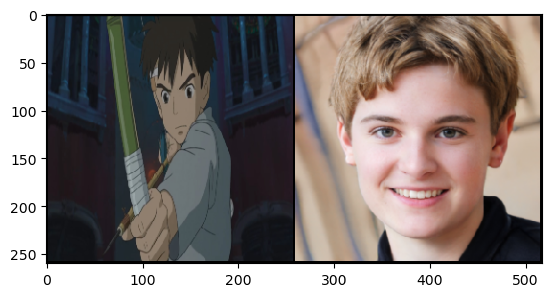

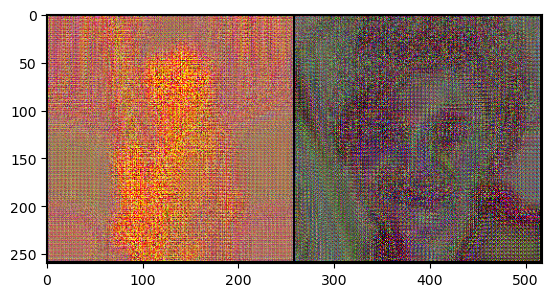

Epoch 1/30:  95%|█████████▌| 2000/2098 [15:02<00:44,  2.21it/s, Gen Loss=6.5983, Disc Loss=0.2577]

Epoch 0: Step 2000: Generator (U-Net) loss: 6.598325726866732, Discriminator loss: 0.2576751642189919


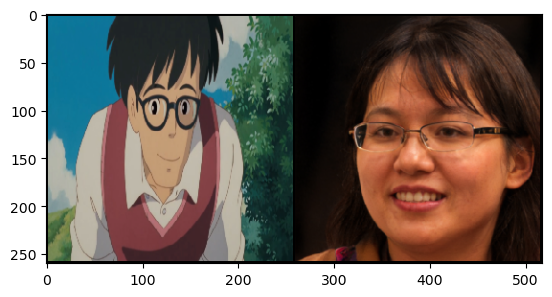

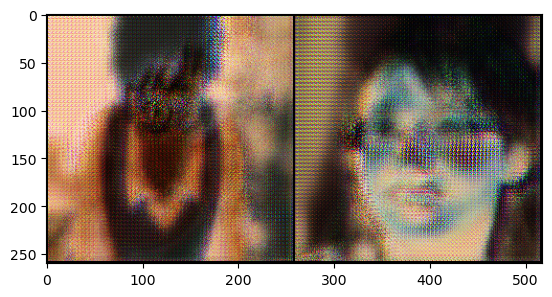

Epoch 2/30:  91%|█████████ | 1902/2098 [14:18<01:29,  2.20it/s, Gen Loss=4.7216, Disc Loss=0.1941]

Epoch 1: Step 4000: Generator (U-Net) loss: 4.721631855607025, Discriminator loss: 0.19408813838288141


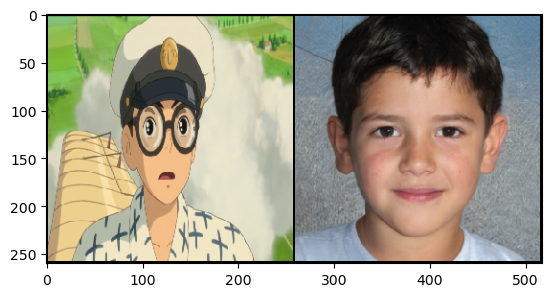

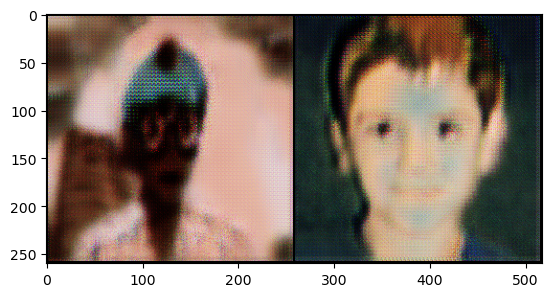

Epoch 3/30:  86%|████████▌ | 1804/2098 [13:33<02:11,  2.24it/s, Gen Loss=4.4211, Disc Loss=0.1955]

Epoch 2: Step 6000: Generator (U-Net) loss: 4.421114615678792, Discriminator loss: 0.19553634819015844


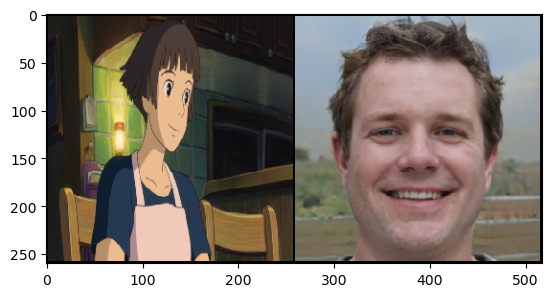

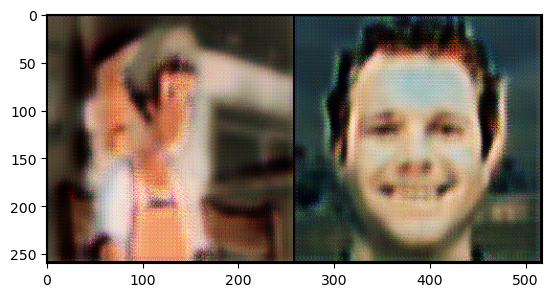

Epoch 4/30:  81%|████████▏ | 1706/2098 [13:41<06:44,  1.03s/it, Gen Loss=4.2039, Disc Loss=0.1840]

Epoch 3: Step 8000: Generator (U-Net) loss: 4.203948233604429, Discriminator loss: 0.18401916430518006


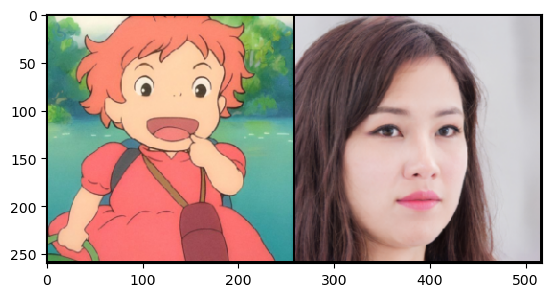

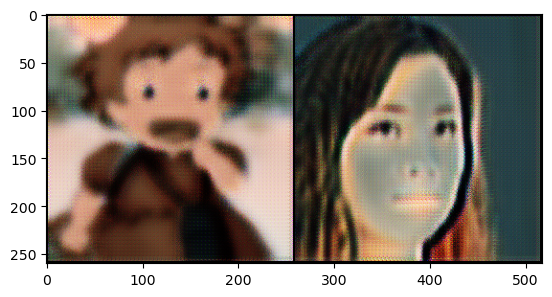

Epoch 5/30:  77%|███████▋  | 1608/2098 [26:01<08:49,  1.08s/it, Gen Loss=4.0939, Disc Loss=0.1724]

Epoch 4: Step 10000: Generator (U-Net) loss: 4.093928643107413, Discriminator loss: 0.1723977299220858


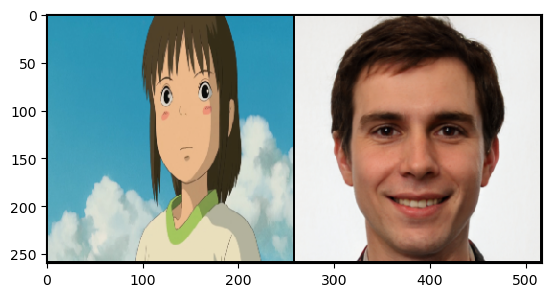

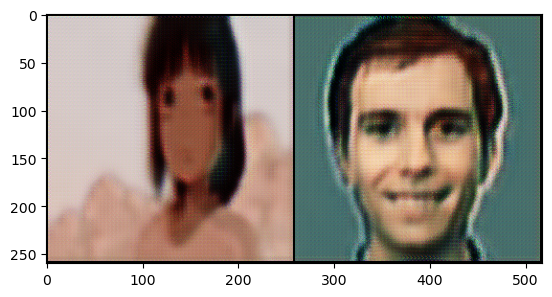

Epoch 6/30:  72%|███████▏  | 1510/2098 [23:38<04:19,  2.26it/s, Gen Loss=4.0036, Disc Loss=0.1667]

Epoch 5: Step 12000: Generator (U-Net) loss: 4.0035738584995295, Discriminator loss: 0.166740264784545


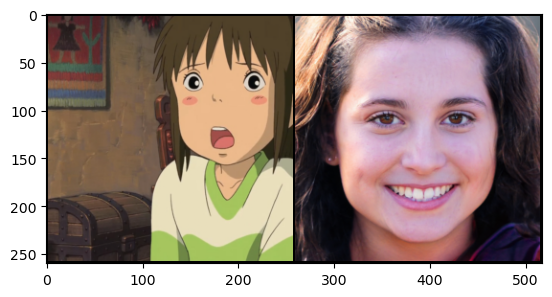

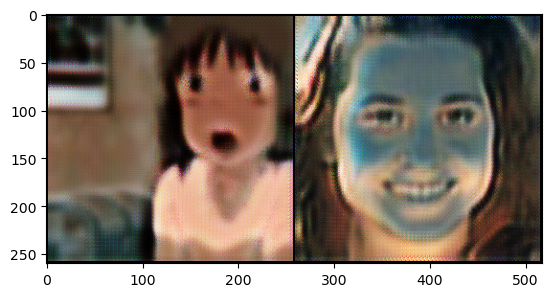

Epoch 7/30:  67%|██████▋   | 1412/2098 [10:37<05:10,  2.21it/s, Gen Loss=3.9277, Disc Loss=0.1617]

Epoch 6: Step 14000: Generator (U-Net) loss: 3.927659097194671, Discriminator loss: 0.16174877871572968


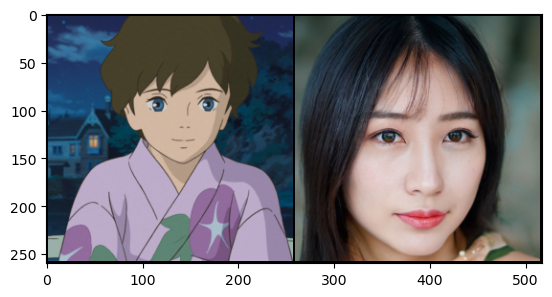

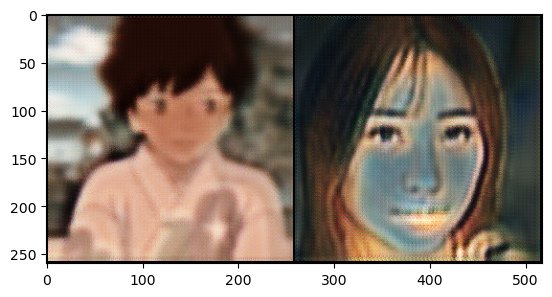

Epoch 8/30:  63%|██████▎   | 1314/2098 [09:52<05:52,  2.23it/s, Gen Loss=3.8761, Disc Loss=0.1542]

Epoch 7: Step 16000: Generator (U-Net) loss: 3.8760836640596352, Discriminator loss: 0.15421915411576637


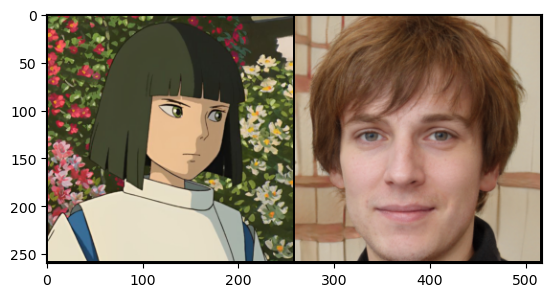

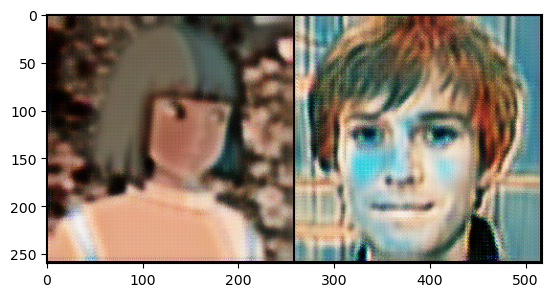

Epoch 9/30:  58%|█████▊    | 1216/2098 [09:07<06:38,  2.21it/s, Gen Loss=3.8456, Disc Loss=0.1474]

Epoch 8: Step 18000: Generator (U-Net) loss: 3.845591255307201, Discriminator loss: 0.14739020977541803


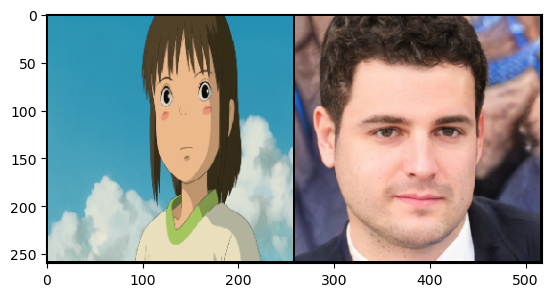

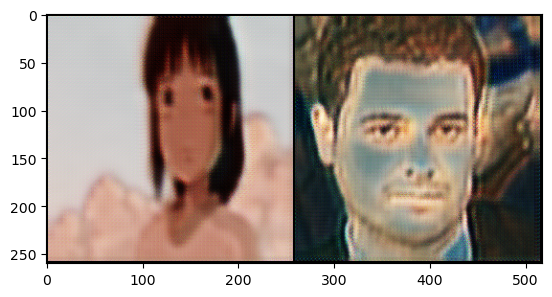

Epoch 10/30:  53%|█████▎    | 1118/2098 [08:23<07:18,  2.23it/s, Gen Loss=3.8303, Disc Loss=0.1430]

Epoch 9: Step 20000: Generator (U-Net) loss: 3.8302847509384197, Discriminator loss: 0.14302625282295015


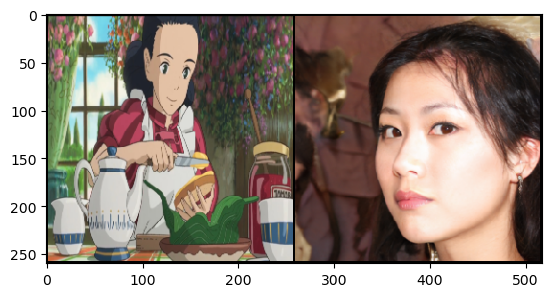

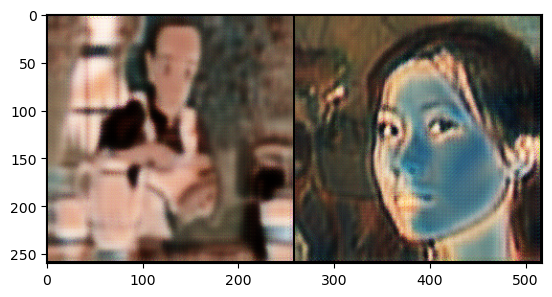

Epoch 11/30:  49%|████▊     | 1020/2098 [07:38<08:06,  2.22it/s, Gen Loss=3.7882, Disc Loss=0.1386]

Epoch 10: Step 22000: Generator (U-Net) loss: 3.788202655434608, Discriminator loss: 0.13858657131344068


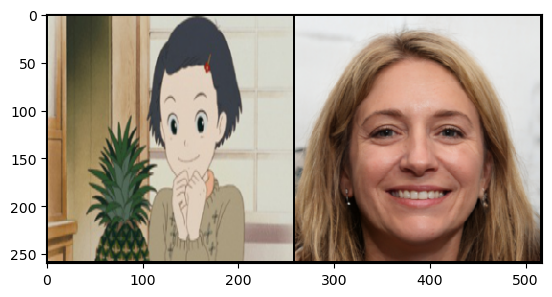

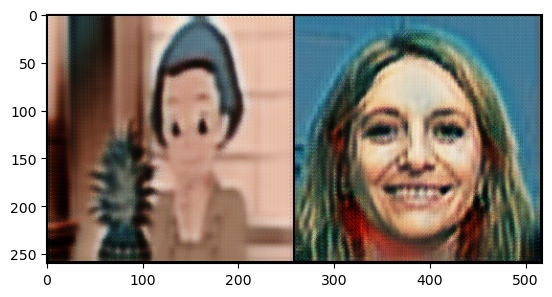

Epoch 12/30:  44%|████▍     | 922/2098 [06:54<08:56,  2.19it/s, Gen Loss=3.8011, Disc Loss=0.1361]

Epoch 11: Step 24000: Generator (U-Net) loss: 3.8011413693428056, Discriminator loss: 0.13607560768350951


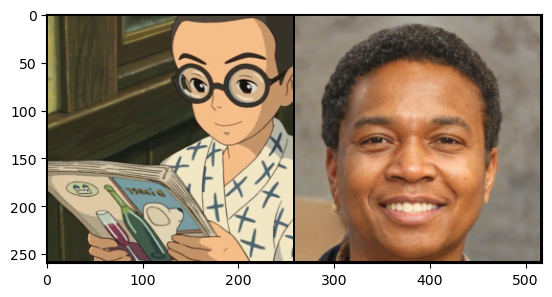

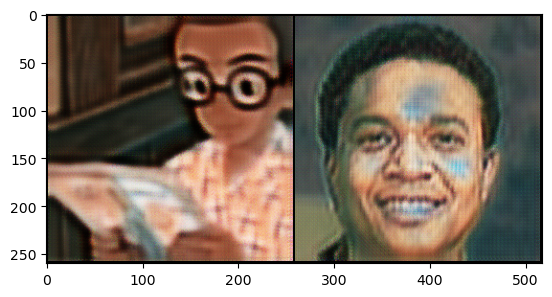

Epoch 13/30:  39%|███▉      | 824/2098 [06:10<09:34,  2.22it/s, Gen Loss=3.7743, Disc Loss=0.1320]

Epoch 12: Step 26000: Generator (U-Net) loss: 3.7742900191545408, Discriminator loss: 0.1319737728983164


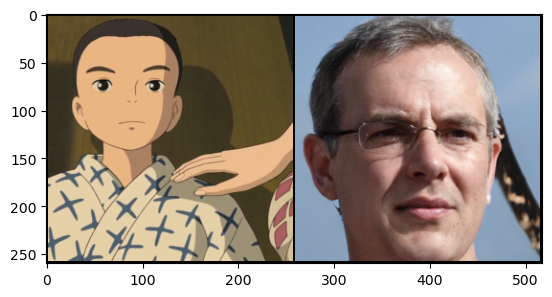

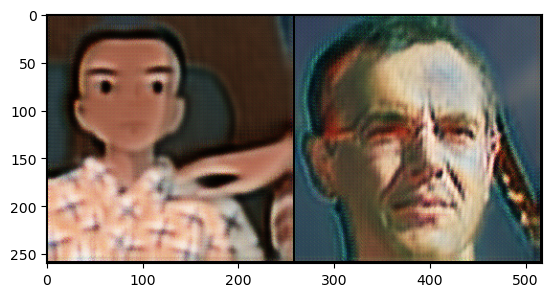

Epoch 14/30:  35%|███▍      | 726/2098 [05:26<10:17,  2.22it/s, Gen Loss=3.7722, Disc Loss=0.1260]

Epoch 13: Step 28000: Generator (U-Net) loss: 3.7722180795669544, Discriminator loss: 0.12599602888524547


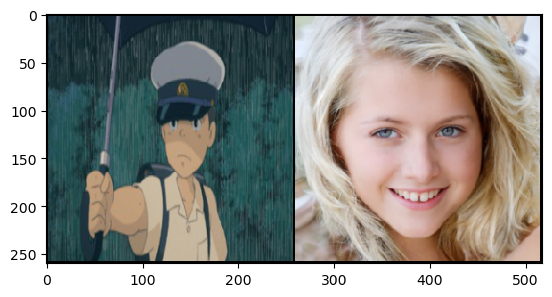

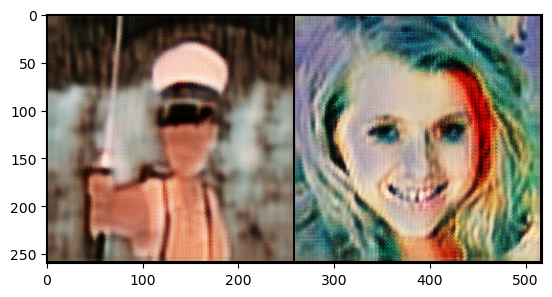

Epoch 15/30:  30%|██▉       | 628/2098 [04:43<11:00,  2.22it/s, Gen Loss=3.7953, Disc Loss=0.1220]

Epoch 14: Step 30000: Generator (U-Net) loss: 3.7952615008354096, Discriminator loss: 0.12202384270727627


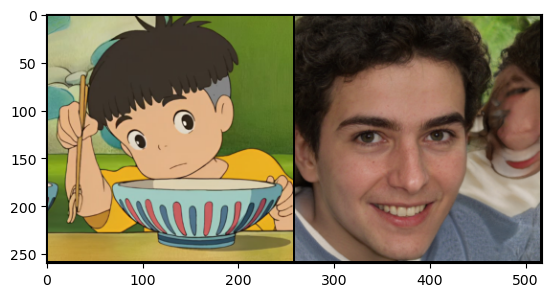

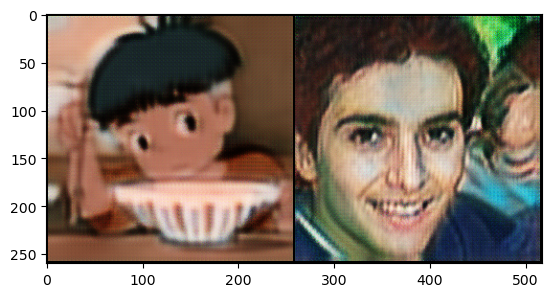

Epoch 16/30:  25%|██▌       | 530/2098 [03:59<11:43,  2.23it/s, Gen Loss=3.7839, Disc Loss=0.1172]

Epoch 15: Step 32000: Generator (U-Net) loss: 3.783939562201502, Discriminator loss: 0.11719885563664134


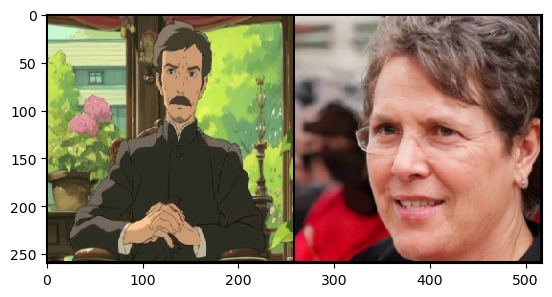

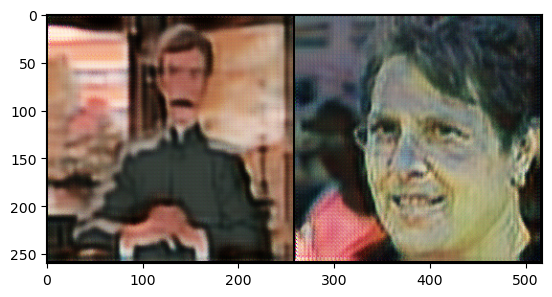

Epoch 17/30:  21%|██        | 432/2098 [03:15<12:29,  2.22it/s, Gen Loss=3.7595, Disc Loss=0.1181]

Epoch 16: Step 34000: Generator (U-Net) loss: 3.759488243103028, Discriminator loss: 0.11813838999345917


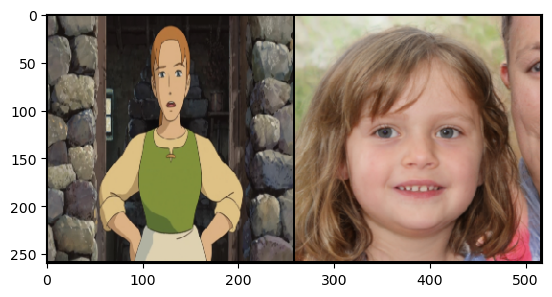

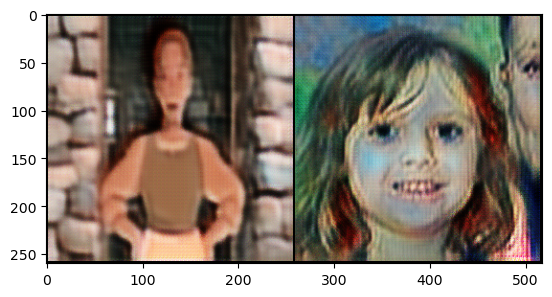

Epoch 18/30:  16%|█▌        | 334/2098 [02:31<13:07,  2.24it/s, Gen Loss=3.7697, Disc Loss=0.1175]

Epoch 17: Step 36000: Generator (U-Net) loss: 3.769683595657346, Discriminator loss: 0.11753417841531338


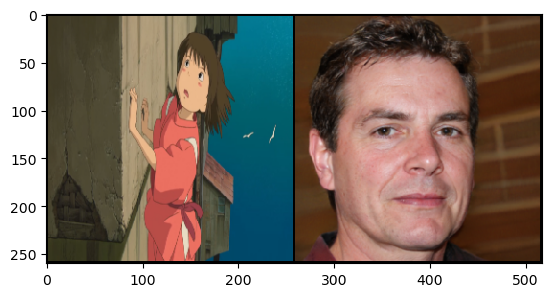

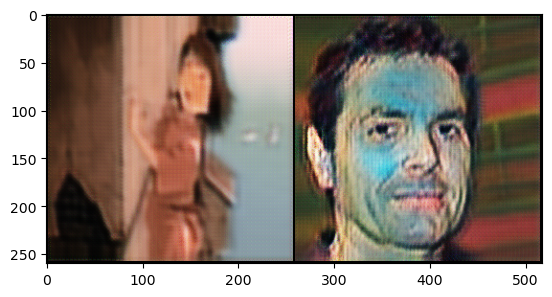

Epoch 19/30:  11%|█         | 236/2098 [01:46<14:04,  2.20it/s, Gen Loss=3.7525, Disc Loss=0.1157]

Epoch 18: Step 38000: Generator (U-Net) loss: 3.7525167195796962, Discriminator loss: 0.11568023062869913


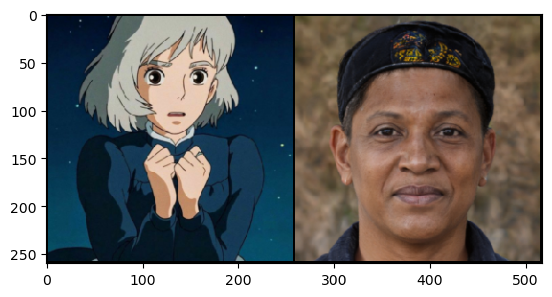

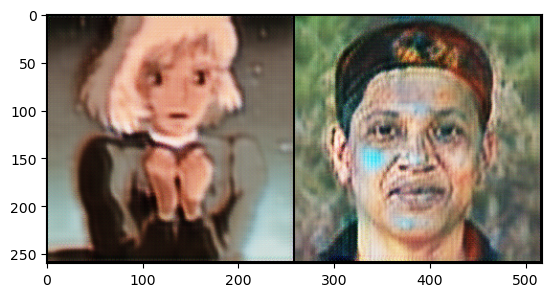

Epoch 20/30:   7%|▋         | 138/2098 [01:02<14:36,  2.24it/s, Gen Loss=3.7629, Disc Loss=0.1148]

Epoch 19: Step 40000: Generator (U-Net) loss: 3.762854262113567, Discriminator loss: 0.11481778737530088


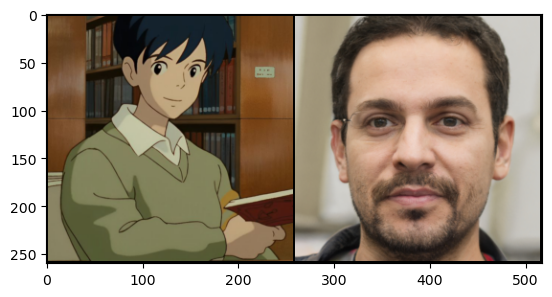

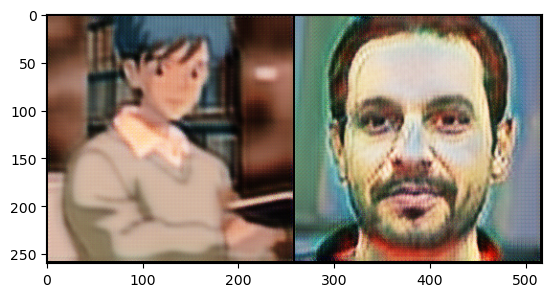

Epoch 21/30:   2%|▏         | 40/2098 [00:18<15:22,  2.23it/s, Gen Loss=3.7537, Disc Loss=0.1146]

Epoch 20: Step 42000: Generator (U-Net) loss: 3.7537117103338202, Discriminator loss: 0.11459740066714584


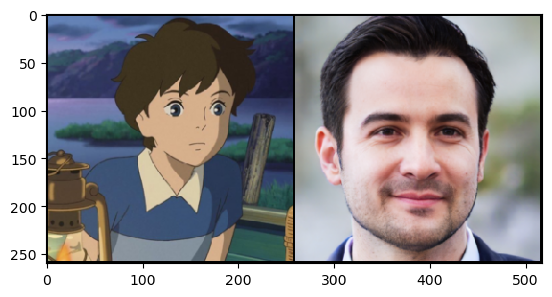

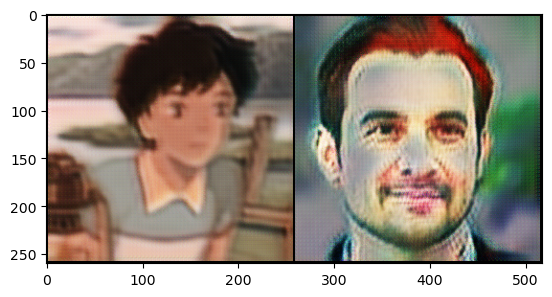

Epoch 21/30:  97%|█████████▋| 2040/2098 [15:22<00:25,  2.23it/s, Gen Loss=3.7601, Disc Loss=0.1161]

Epoch 20: Step 44000: Generator (U-Net) loss: 3.760069365501407, Discriminator loss: 0.11607374677807096


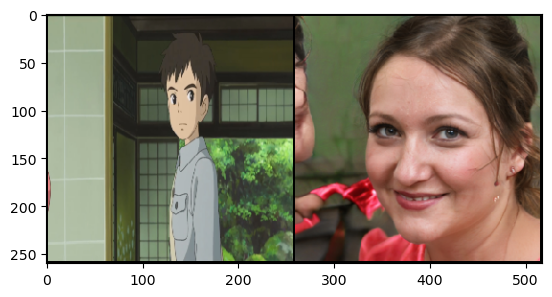

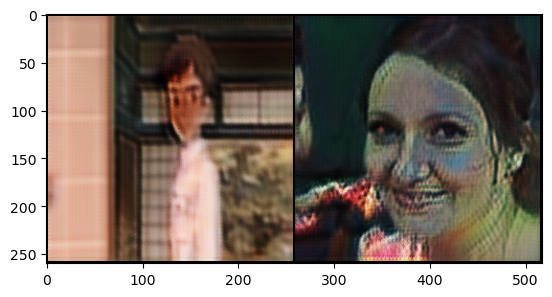

Epoch 22/30:  93%|█████████▎| 1942/2098 [14:37<01:10,  2.21it/s, Gen Loss=3.7491, Disc Loss=0.1141]

Epoch 21: Step 46000: Generator (U-Net) loss: 3.7490660455226914, Discriminator loss: 0.11405483673885454


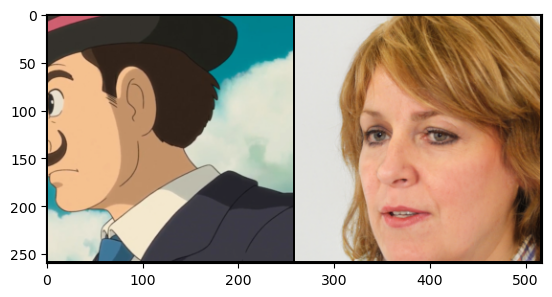

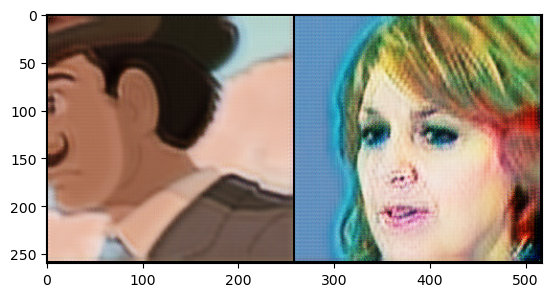

Epoch 23/30:  88%|████████▊ | 1844/2098 [13:52<01:54,  2.21it/s, Gen Loss=3.7492, Disc Loss=0.1118]

Epoch 22: Step 48000: Generator (U-Net) loss: 3.749225359797476, Discriminator loss: 0.11179066822119049


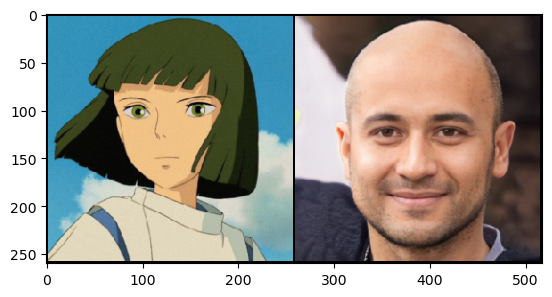

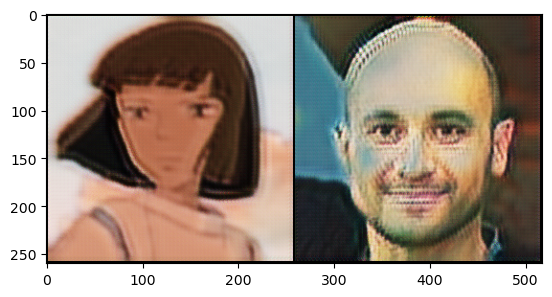

Epoch 24/30:  83%|████████▎ | 1746/2098 [13:10<02:38,  2.23it/s, Gen Loss=3.7434, Disc Loss=0.1127]

Epoch 23: Step 50000: Generator (U-Net) loss: 3.7433626700639717, Discriminator loss: 0.11267575143277637


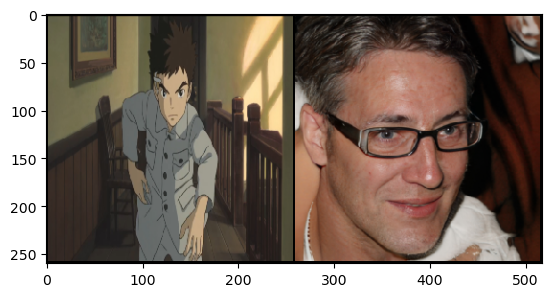

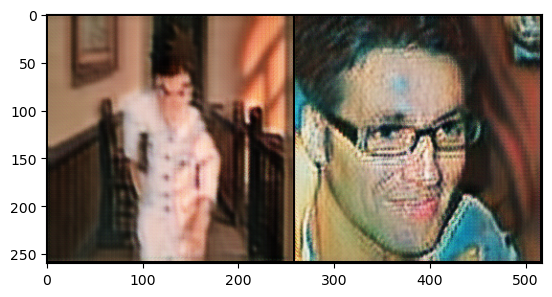

Epoch 25/30:  79%|███████▊  | 1648/2098 [12:25<03:25,  2.19it/s, Gen Loss=3.7461, Disc Loss=0.1116]

Epoch 24: Step 52000: Generator (U-Net) loss: 3.746124193787578, Discriminator loss: 0.11164869480766358


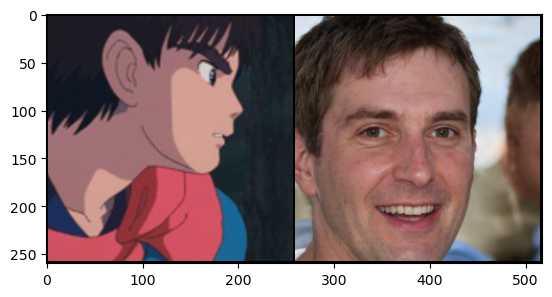

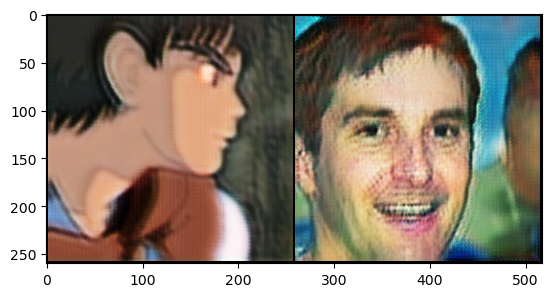

Epoch 26/30:  74%|███████▍  | 1550/2098 [15:26<09:44,  1.07s/it, Gen Loss=3.7542, Disc Loss=0.1116]

Epoch 25: Step 54000: Generator (U-Net) loss: 3.7542472981214483, Discriminator loss: 0.1115828921310603


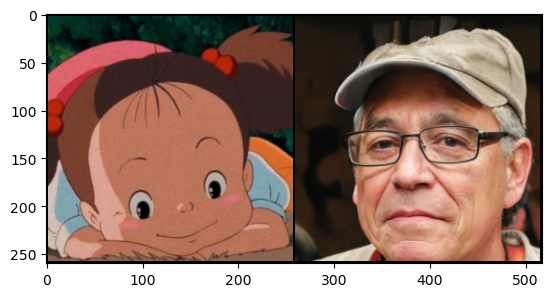

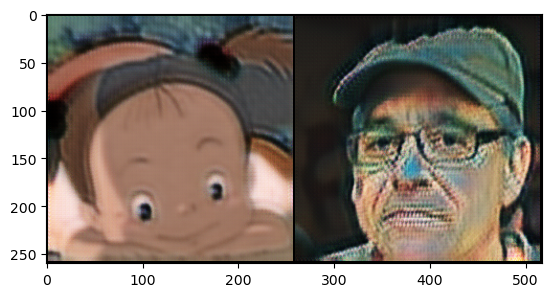

Epoch 27/30:  69%|██████▉   | 1452/2098 [21:47<05:08,  2.09it/s, Gen Loss=3.7314, Disc Loss=0.1106]

Epoch 26: Step 56000: Generator (U-Net) loss: 3.731444298505785, Discriminator loss: 0.11064093968644766


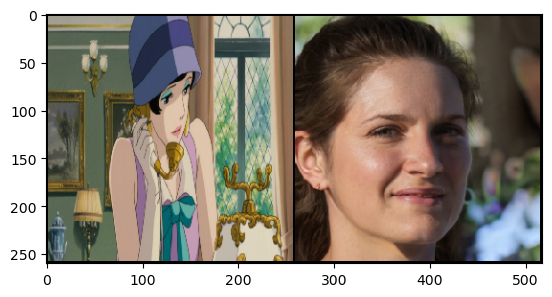

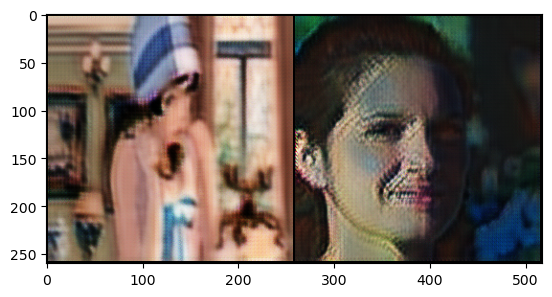

Epoch 28/30:  65%|██████▍   | 1354/2098 [12:07<05:52,  2.11it/s, Gen Loss=3.7260, Disc Loss=0.1079]

Epoch 27: Step 58000: Generator (U-Net) loss: 3.7259773100614546, Discriminator loss: 0.10787857426330455


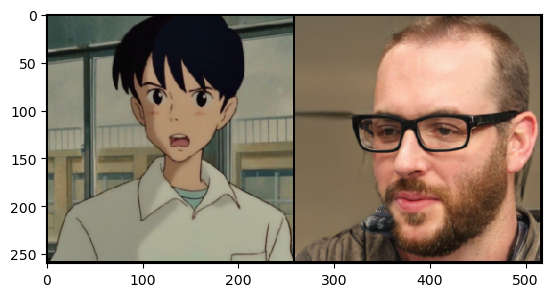

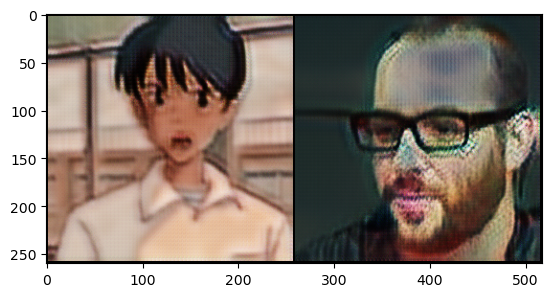

Epoch 29/30:  60%|█████▉    | 1256/2098 [09:45<06:40,  2.10it/s, Gen Loss=3.7357, Disc Loss=0.1073]

Epoch 28: Step 60000: Generator (U-Net) loss: 3.735663286805157, Discriminator loss: 0.10734337322600157


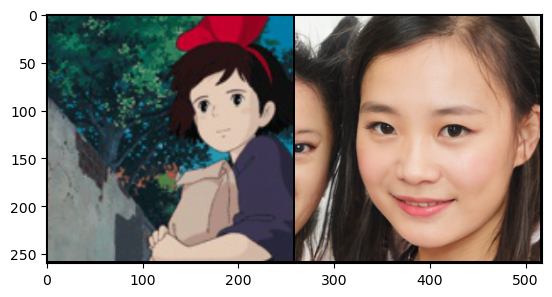

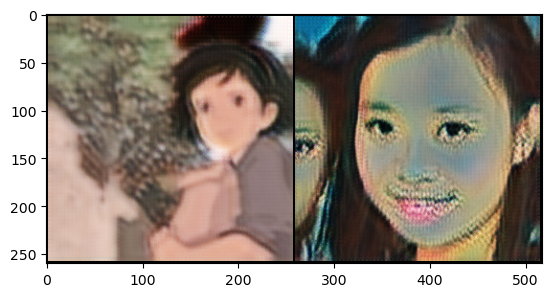

Epoch 30/30:  55%|█████▌    | 1158/2098 [10:31<08:27,  1.85it/s, Gen Loss=3.7505, Disc Loss=0.1052]

Epoch 29: Step 62000: Generator (U-Net) loss: 3.750502186298376, Discriminator loss: 0.10523016801290225


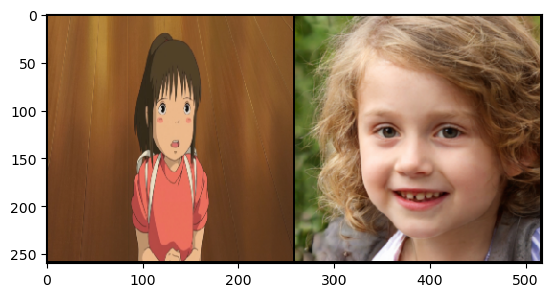

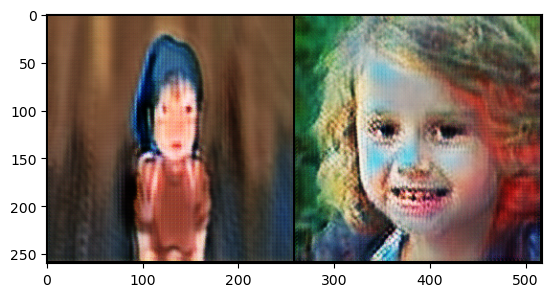

Epoch 30/30: 100%|██████████| 2098/2098 [18:04<00:00,  1.94it/s, Gen Loss=3.7505, Disc Loss=0.1052]


In [127]:
from tqdm import tqdm  # 이미 import 되어 있다면 생략
import torch

def train(save_model=True):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        with tqdm(dataloader, desc=f"Epoch {epoch+1}/{n_epochs}", leave=True) as pbar:
            for real_A, real_B in pbar:
                real_A = nn.functional.interpolate(real_A, size=target_shape)
                real_B = nn.functional.interpolate(real_B, size=target_shape)
                cur_batch_size = len(real_A)

                real_A = real_A.to(device)
                real_B = real_B.to(device)

                ### Update discriminator A ###
                disc_A_opt.zero_grad()
                with torch.no_grad():
                    fake_A = gen_BA(real_B)
                disc_A_loss = get_disc_loss(real_A, fake_A, disc_A, adv_criterion)
                disc_A_loss.backward(retain_graph=True)
                disc_A_opt.step()

                ### Update discriminator B ###
                disc_B_opt.zero_grad()
                with torch.no_grad():
                    fake_B = gen_AB(real_A)
                disc_B_loss = get_disc_loss(real_B, fake_B, disc_B, adv_criterion)
                disc_B_loss.backward(retain_graph=True)
                disc_B_opt.step()

                ### Update generator ###
                gen_opt.zero_grad()
                gen_loss, fake_A, fake_B = get_gen_loss(
                    real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, adv_criterion, recon_criterion, recon_criterion
                )
                gen_loss.backward()
                gen_opt.step()

                mean_discriminator_loss += disc_A_loss.item() / display_step
                mean_generator_loss += gen_loss.item() / display_step

                if cur_step % display_step == 0:
                    pbar.set_postfix({
                        "Gen Loss": f"{mean_generator_loss:.4f}",
                        "Disc Loss": f"{mean_discriminator_loss:.4f}"
                    })
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                    show_tensor_images(torch.cat([real_A, real_B]), size=(dim_A, target_shape, target_shape))
                    show_tensor_images(torch.cat([fake_B, fake_A]), size=(dim_B, target_shape, target_shape))
                    mean_generator_loss = 0
                    mean_discriminator_loss = 0
                    if save_model:
                        torch.save({
                            'gen_AB': gen_AB.state_dict(),
                            'gen_BA': gen_BA.state_dict(),
                            'gen_opt': gen_opt.state_dict(),
                            'disc_A': disc_A.state_dict(),
                            'disc_A_opt': disc_A_opt.state_dict(),
                            'disc_B': disc_B.state_dict(),
                            'disc_B_opt': disc_B_opt.state_dict()
                        }, f"cycleGAN_{cur_step}.pth")
                cur_step += 1

train()
